In [ ]:
#default_exp augment

In [ ]:
#hide
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Data Augmentation for Audio

> Transforms to apply data augmentation to AudioSpectrograms and Signals

In [ ]:
#export
from fastai2.torch_basics import *
from fastai2.data.all import *
from fastai2_audio.core import *
from fastai2.vision.all import *

In [ ]:
# export
import torch.nn
from torch import stack, zeros_like as t0, ones_like as t1
from torch.distributions.bernoulli import Bernoulli
from librosa.effects import split
from dataclasses import asdict
from scipy.signal import resample_poly
from scipy.ndimage.interpolation import shift
import librosa
import colorednoise as cn
from fastprogress import progress_bar as pb
from nbdev.showdoc import *

# Table of Contents
1. [Preprocessing Functions](#Preprocessing-Functions)  
    1. [Remove Silence](#Remove-Silence)
    1. [Resampling](#Resampling)
1. [Signal Transforms](#Signal-Transforms)
    1. [Signal Cropping/Padding](#Signal-Cropping/Padding)
    1. [Signal Shifting](#Signal-Shifting)
    1. [Add Noise to Signal](#Add-Noise-to-Signal)
    1. [Adjust Volume](#Adjust-Volume)
    1. [Signal Cutout](#Signal-Cutout)
    1. [Signal Loss](#Signal-Loss)
    1. [DownmixMono](#DownmixMono)
1. [Spectrogram Transforms](#Spectrogram-Transforms)
    1. [Time Cropping](#Time-Cropping)
    1. [Time and Frequency Masking (SpecAugment)](#Time-and-Frequency-Masking-(SpecAugment))
    1. [Spectrogram Rolling](#Spectrogram-Rolling)
    1. [Delta/Accelerate](#Delta/Accelerate)
1. [Pipelines](#Pipelines)
    1. [Signal Pipelines](#Signal-Pipelines)
    1. [Spectrogram Pipelines](#Spectrogram-Pipelines)

## Setup Examples

In [ ]:
p = Config()['data_path'] / 'ST-AEDS-20180100_1-OS'
untar_data(URLs.SPEAKERS10, fname=str(p)+'.tar', dest=p)
x = AudioGetter("", recurse=True, folders=None)
files = x(p)

In [ ]:
#files will load differently on different machines so we specify examples by name
ex_files = [p/f for f in ['m0005_us_m0005_00218.wav', 
                                'f0003_us_f0003_00279.wav', 
                                'f0001_us_f0001_00168.wav', 
                                'f0005_us_f0005_00286.wav',]]

In [ ]:
audio_orig = AudioItem.create(ex_files[0])
a2s = AudioToSpec(n_fft = 1024, hop_length=256)
sg_orig = a2s(audio_orig)

In [ ]:
#sc= single channel, mc = multichannel
@docs
class GenExample:
    "Generate individual or batch of single/multichannel AudioItems and AudioSpectrograms for testing"
    
    a2s = AudioToSpec(n_fft = 1024, hop_length=256)
    def audio_sc(): return AudioItem.create(ex_files[0])

    def audio_mc():
        #get 3 equal length portions of 3 different signals so we can stack them
        #for a fake multichannel example
        ai0, ai1, ai2 = map(AudioItem.create, ex_files[1:4]);
        min_samples = min(ai0.nsamples, ai1.nsamples, ai2.nsamples)
        s0, s1, s2 = map(lambda x: x[:,:min_samples], (ai0, ai1, ai2))
        return AudioItem.from_signal(torch.cat((s0, s1, s2), dim=0), 16000)

    def audio_sc_batch(bs=8):
        return AudioItem.from_signal(torch.stack([AudioItem.create(ex_files[0]) for i in range(bs)]), 16000)

    def audio_mc_batch(bs=8):
        return AudioItem.from_signal(torch.stack([GenExample.audio_mc() for i in range(bs)]), 16000)
    
    def sg_sc(): return a2s(GenExample.audio_sc())
    def sg_mc(): return a2s(GenExample.audio_mc())
    
    _docs=dict(audio_sc="Generate a single-channel audio", 
               audio_mc="Generate a multi-channel audio", 
               audio_sc_batch="Generate a batch of single-channel audios", 
               audio_mc_batch="Generate a batch of multi-channel audios",
               sg_sc="Generate a spectrogram of a single-channel audio",
               sg_mc="Generate a spectrogram of a multi-channel audio",
               #sg_sc_batch="Generate a batch of spectrograms of a single-channel audios",
              )

In [ ]:
show_doc(GenExample.audio_sc)

<h4 id="GenExample.audio_sc" class="doc_header"><code>GenExample.audio_sc</code><a href="__main__.py#L7" class="source_link" style="float:right">[source]</a></h4>

> <code>GenExample.audio_sc</code>()

Generate a single-channel audio

<div class="alert alert-block alert-warning"> <strong>Warning:</strong> calling inp.clone() does not copy it's attributes, such as sr in the case of an AudioItem. Since transforms mutate in place, any testing that requires the input sample rate must store the sample rate before the transform so that it may be tested after. See the tests in resampling for an example </div> 

In [ ]:
def show_transform(transform, gen_input=GenExample.audio_sc, show=True):
    '''Generate a new input, apply transform, and display/return both input and output'''
    inp = gen_input()
    inp_orig = inp.clone()
    if show is not None: inp.show() if show else inp.hear()
    out = transform(inp, split_idx=0) if isinstance(transform, RandTransform) else transform(inp)
    if show is not None: out.show() if show else out.hear()
    return inp_orig, out

In [ ]:
aud_ex = GenExample.audio_sc()
aud_mc_ex = GenExample.audio_mc()
aud_batch = GenExample.audio_sc_batch(4)
aud_mc_batch = GenExample.audio_mc_batch(8)
test_eq(type(aud_ex), AudioItem)
test_eq(type(aud_batch), AudioItem)
test_eq(aud_batch.shape, torch.Size([4, 1, 58240]))
test_eq(aud_mc_batch.shape, torch.Size([8, 3, 53760]))

In [ ]:
sg_ex = GenExample.sg_sc()
sg_mc_ex = GenExample.sg_mc()

# Preprocessing Functions

<div class = "alert alert-block alert-info"><strong>TO-DO:</strong><br/>
    1. Add in longer clips (whale) and do more extensive testing. Current clip only allows us to test Trim, not All or Split<br/></div>


##  Remove Silence

In [ ]:
#export
mk_class('RemoveType', **{o:o.lower() for o in ['Trim', 'All', 'Split']},
         doc="All methods of removing silence as attributes to get tab-completion and typo-proofing")

In [ ]:
#export
def _merge_splits(splits, pad):
    clip_end = splits[-1][1]
    merged = []
    i=0
    while i < len(splits):
        start = splits[i][0]
        while splits[i][1] < clip_end and splits[i][1] + pad >= splits[i+1][0] - pad:
            i += 1
        end = splits[i][1]
        merged.append(np.array([max(start-pad, 0), min(end+pad, clip_end)]))
        i+=1
    return np.stack(merged)

def RemoveSilence(remove_type=RemoveType.Trim, threshold=20, pad_ms=20):
    def _inner(ai:AudioItem)->AudioItem:
        '''Split signal at points of silence greater than 2*pad_ms '''
        if remove_type is None: return ai
        padding = int(pad_ms/1000*ai.sr)
        if(padding > ai.nsamples): return ai
        splits = split(ai.numpy(), top_db=threshold, hop_length=padding)
        if remove_type == "split":
            sig =  [ai[:,(max(a-padding,0)):(min(b+padding,ai.nsamples))] 
                    for (a, b) in _merge_splits(splits, padding)]
        elif remove_type == "trim":
            sig = [ai[:,(max(splits[0, 0]-padding,0)):splits[-1, -1]+padding]]
        elif remove_type == "all":
            sig = [torch.cat([ai[:,(max(a-padding,0)):(min(b+padding,ai.nsamples))] 
                              for (a, b) in _merge_splits(splits, padding)], dim=1)]
        else: 
            raise ValueError(f"Valid options for silence removal are None, 'split', 'trim', 'all' not '{remove_type}'.")
        ai.data = torch.cat(sig, dim=-1)
        return ai
    return _inner

### Trim Silence

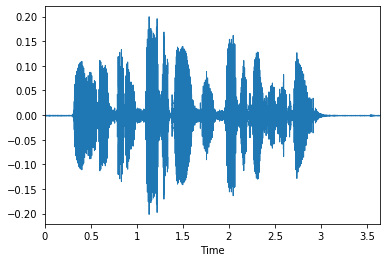

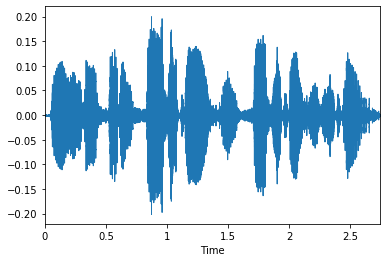

In [ ]:
silencer = RemoveSilence(threshold=20, pad_ms=20)
orig, silenced = show_transform(silencer, GenExample.audio_sc)
# test that at least a half second of silence is being removed
test(silenced.nsamples + 8000, orig.nsamples, operator.le)

In [ ]:
#test that nothing is removed from audio that doesnt contain silence
test_aud = AudioItem.from_signal(torch.rand_like(audio_orig), 16000)
orig_samples = test_aud.nsamples
print(f"Random Noise, no silence, {orig_samples} samples")
test_aud.hear()

for rm_type in [RemoveType.All, RemoveType.Trim, RemoveType.Split]:
    silence_audio_trim = RemoveSilence(rm_type, threshold=20, pad_ms=20)(test_aud)
    print(f"After silence remove {rm_type}, {silence_audio_trim.nsamples} samples")
    test_eq(orig_samples, silence_audio_trim.nsamples)

Random Noise, no silence, 58240 samples


After silence remove all, 58240 samples
After silence remove trim, 58240 samples
After silence remove split, 58240 samples


In [ ]:
# trim silence from a multichannel clip, needs more extensive testing
silence_mc = RemoveSilence(threshold=20, pad_ms=20)
inp, out = show_transform(silence_mc, GenExample.audio_mc, show=False)

#### Trim Silence Timing Tests

In [ ]:
silencer = RemoveSilence(threshold=20, pad_ms=20)
audio_sc = GenExample.audio_sc()
audio_mc = GenExample.audio_mc()

In [ ]:
%%timeit -n10
silencer(audio_sc)

1.56 ms ± 55.1 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
%%timeit -n10
silencer(audio_mc)

1.63 ms ± 29.9 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Resampling

In [ ]:
#export
def Resample(sr_new):
    def _inner(ai:AudioItem)->AudioItem:
        '''Resample using faster polyphase technique and avoiding FFT computation'''
        if(ai.sr == sr_new): return ai
        sig_np = ai.numpy()
        sr_gcd = math.gcd(ai.sr, sr_new)
        resampled = resample_poly(sig_np, int(sr_new/sr_gcd), int(ai.sr/sr_gcd), axis=-1)
        ai.data = torch.from_numpy(resampled.astype(np.float32))
        ai.sr = sr_new
        return ai
    return _inner

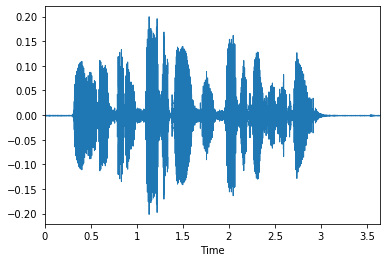

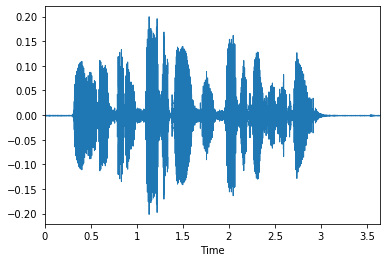

In [ ]:
#Make sure if old and new sample rates are the same, a new identical AudioItem is returned
no_resample_needed = Resample(audio_orig.sr)
inp, out = show_transform(no_resample_needed, GenExample.audio_sc)
test_eq(inp.sr, out.sr)
test_eq(inp, out)

In [ ]:
#test and hear realistic sample rates
audio_orig = GenExample.audio_sc()
orig_sr = audio_orig.sr
print(f"Original Sample Rate {orig_sr} \n")
for rate in [2000,4000,8000,22050,44100]:
    resampler = Resample(rate)
    print("Sample Rate", rate)
    inp, out = show_transform(resampler, GenExample.audio_sc, show=False)
    test_eq(out.nsamples, inp.nsamples//(orig_sr/rate))

Original Sample Rate 16000 

Sample Rate 2000


Sample Rate 4000


Sample Rate 8000


Sample Rate 22050


Sample Rate 44100


In [ ]:
#resample a multichannel audio
resampler = Resample(8000)
inp, out = show_transform(resampler, GenExample.audio_mc, show=False)
test_eq(inp.nsamples//2, out.nsamples)
test_eq(inp.nchannels, out.nchannels)
test_eq(out.sr, 8000)

In [ ]:
for i in pb(range(100)):
    audio_orig = GenExample.audio_sc()
    random_sr = random.randint(16000, 72000)
    random_upsample = Resample(random_sr)(audio_orig)
    num_samples = random_upsample.nsamples
    test_close(num_samples, abs(audio_orig.nsamples//(audio_orig.sr/random_sr)), eps=1.1)

#### Resample Timing Tests

In [ ]:
# Polyphase resampling's speed is dependent on the GCD between old and new rate. For almost all used sample rates it
# will be very fast and much better than any FFT based method. It is slow however in the unlikely event that the 
# GCD is small (demonstrated below w GCD of 1 for last 2 examples)
common_downsample = Resample(8000)
slow_downsample = Resample(8001)
slow_upsample = Resample(27101)
audio_sc = GenExample.audio_sc()
audio_mc = GenExample.audio_mc()

In [ ]:
%%time
common_downsample(audio_sc)

CPU times: user 12 ms, sys: 0 ns, total: 12 ms
Wall time: 2.89 ms


tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., -2.7515e-04,
         -2.1502e-04, -3.7679e-05]])

In [ ]:
%%time
common_downsample(audio_mc)

CPU times: user 28 ms, sys: 0 ns, total: 28 ms
Wall time: 7.36 ms


tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., -1.7625e-03,
         -1.2562e-03, -6.0365e-04],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., -3.1290e-05,
         -3.8538e-05,  1.0710e-04],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  4.9272e-05,
          3.9761e-05,  8.9849e-05]])

In [ ]:
%%time
slow_downsample(audio_sc)

CPU times: user 108 ms, sys: 0 ns, total: 108 ms
Wall time: 26.9 ms


tensor([[ 1.3499e-23,  2.6595e-12, -1.2066e-11,  ..., -2.6653e-04,
         -1.5343e-04, -3.0850e-06]])

In [ ]:
%%time
slow_upsample(audio_mc)

CPU times: user 216 ms, sys: 4 ms, total: 220 ms
Wall time: 95.7 ms


tensor([[ 2.7587e-24,  1.1815e-09,  1.7938e-09,  ..., -3.7292e-04,
         -1.7601e-04, -3.4302e-05],
        [-9.0046e-25,  2.0666e-09,  3.0623e-09,  ...,  9.8098e-05,
          6.0099e-05,  1.4080e-05],
        [ 1.8593e-24,  3.2510e-09,  4.8764e-09,  ...,  6.8579e-05,
          3.7435e-05,  8.0894e-06]])

# Signal Transforms

## Signal Cropping/Padding

<div class = "alert alert-block alert-info"> CropSignal and CropTime can either be merged into one function, or they can outsource the bulk of their behavior to a shared cropping function</div>

In [ ]:
#export
mk_class('AudioPadType', **{o:o.lower() for o in ['Zeros', 'Zeros_After', 'Repeat']},
         doc="All methods of padding audio as attributes to get tab-completion and typo-proofing")

In [ ]:
#export
def CropSignal(duration, pad_mode=AudioPadType.Zeros):
    def _inner(ai: AudioItem)->AudioItem:
        '''Crops signal to be length specified in ms by duration, padding if needed'''
        sig = ai.data
        orig_samples = ai.nsamples
        crop_samples = int((duration/1000)*ai.sr)
        if orig_samples == crop_samples: return ai
        elif orig_samples < crop_samples: 
            ai.data = _tfm_pad_signal(sig, crop_samples, pad_mode=pad_mode)
        else:
            crop_start = random.randint(0, int(orig_samples-crop_samples))
            ai.data = sig[:,crop_start:crop_start+crop_samples]
        return ai
    return _inner

In [ ]:
#export
def _tfm_pad_signal(sig, width, pad_mode=AudioPadType.Zeros):
    '''Pad spectrogram to specified width, using specified pad mode'''
    c,x = sig.shape
    pad_m = pad_mode.lower()
    if pad_m in ["zeros", "zeros_after"]:
        zeros_front = random.randint(0, width-x) if pad_m == "zeros" else 0
        pad_front = torch.zeros((c, zeros_front))
        pad_back = torch.zeros((c, width-x-zeros_front))
        return torch.cat((pad_front, sig, pad_back), 1)
    elif pad_m == "repeat":
        repeats = width//x + 1
        return sig.repeat(1,repeats)[:,:width]
    else:
        raise ValueError(f"pad_mode {pad_m} not currently supported, only 'zeros', 'zeros_after', or 'repeat'")

In [ ]:
inp, out1000 = show_transform(CropSignal(1000), GenExample.audio_sc, show=None)
inp, out2000 = show_transform(CropSignal(2000), GenExample.audio_sc, show=None)
inp, out5000 = show_transform(CropSignal(5000), GenExample.audio_sc, show=None)

Original Audio is 3.64 seconds


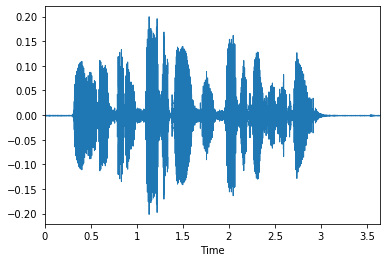

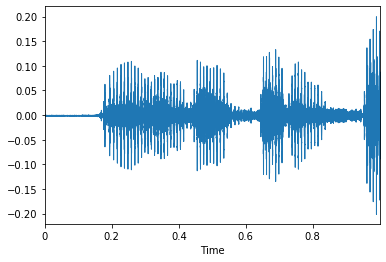

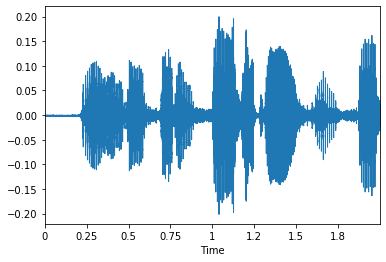

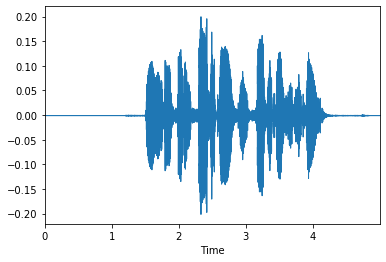

In [ ]:
print(f"Original Audio is {inp.duration:.2f} seconds")
inp.show()
out1000.show()
out2000.show()
out5000.show()

In [ ]:
test_eq(out1000.nsamples, 1*inp.sr)
test_eq(out2000.nsamples, 2*inp.sr)
test_eq(out5000.nsamples, 5*inp.sr)
test_eq(out1000.duration, 1)
test_eq(out2000.duration, 2)
test_eq(out5000.duration, 5)

In [ ]:
inp, mc1000 = show_transform(CropSignal(1000), GenExample.audio_mc, show=None)
inp, mc2000 = show_transform(CropSignal(2000), GenExample.audio_mc, show=None)
inp, mc5000 = show_transform(CropSignal(5000), GenExample.audio_mc, show=None)
test_eq(mc1000.duration, 1)
test_eq(mc2000.duration, 2)
test_eq(mc5000.duration, 5)

### Test Signal Padding Modes

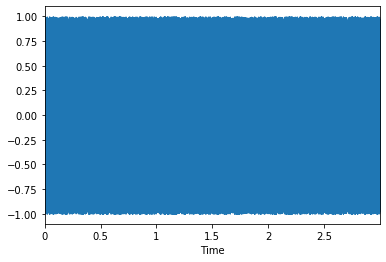

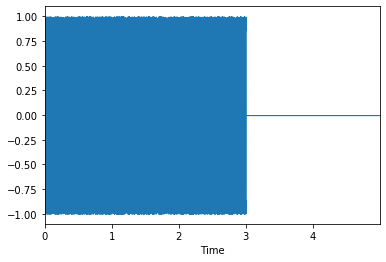

In [ ]:
# test pad_mode zeros-after
audio_orig = GenExample.audio_sc()
cropsig_pad_after = CropSignal(5000, pad_mode=AudioPadType.Zeros_After)
# generate a random input signal that is 3s long
gen_func = lambda: AudioItem.from_signal(torch.rand(1, 48000), 16000)
inp, out = show_transform(cropsig_pad_after, gen_func)
# test end of signal is padded with zeros
test_eq(out[:,-10:], torch.zeros_like(out)[:,-10:])
# test front of signal is not padded with zeros
test_ne(out[:,0:10] , out[:,-10:])

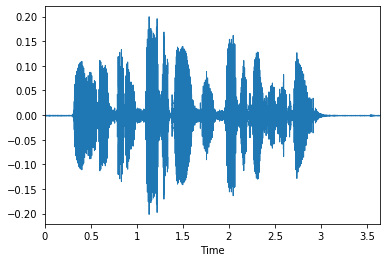

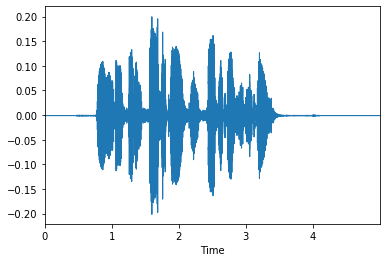

In [ ]:
# test pad_mode zeros by verifying signal begins and ends with zeros
cropsig_pad = CropSignal(5000)
inp, out = show_transform(cropsig_pad, GenExample.audio_sc)
test_eq(out[:,0:2], out[:,-2:])

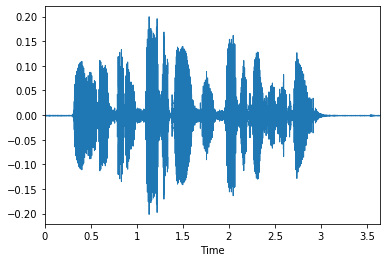

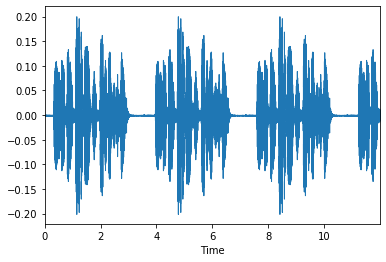

In [ ]:
# test pad_mode repeat by making sure that columns are equal at the appropriate offsets
cropsig_repeat = CropSignal(12000, pad_mode=AudioPadType.Repeat)
inp, out = show_transform(cropsig_repeat, GenExample.audio_sc)
for i in range(inp.nsamples):
    test_eq(out[:,i], out[:,i+inp.nsamples])
    test_eq(out[:,i], out[:,i+2*inp.nsamples])

In [ ]:
# test bad pad_mode doesnt fail silently
test_fail(CropSignal(12000, pad_mode="tenchify"))

In [ ]:
# demonstrate repeat mode works on multichannel data (change "show=None" to "True" to see output)
inp, out = show_transform(cropsig_repeat, GenExample.audio_mc, show=None)

#### Cropping/Padding Timing Tests

In [ ]:
%%time
aud1s = CropSignal(1000)(audio_orig)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 67.2 µs


In [ ]:
%%time
aud2s = CropSignal(2000)(audio_orig)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 246 µs


In [ ]:
%%time
aud5s = CropSignal(5000)(audio_orig)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 188 µs


## Signal Shifting

In [ ]:
#v1 used scipy.ndimage.interpolation.shift but it was extremely slow (14-16ms) so I rewrote and got it down to 50µs


In [ ]:
np.roll(np.array([1,2,3,4,5,6,7]), 2)

array([6, 7, 1, 2, 3, 4, 5])

In [ ]:
# version before optimization
# def _shift(sig, s):
#     samples = sig.shape[-1]
#     if   s == 0: return sig
#     elif  s < 0: return torch.cat([sig[...,-1*s:], torch.zeros_like(sig)[...,s:]], dim=-1)
#     else       : return torch.cat([torch.zeros_like(sig)[...,:s], sig[...,:samples-s]], dim=-1)

# def shift_signal(t:torch.Tensor, shift, roll):
#     #refactor 2nd half of this statement to just take and roll the final axis
#     if roll: t.data = torch.from_numpy(np.roll(t.numpy(), shift, axis=-1))
#     else   : t.data = _shift(t, shift)
#     return t

In [ ]:
def _shift(sig, s):
    if s == 0: return sig
    out = torch.zeros_like(sig)
    if  s < 0: out[...,:s] = sig[...,-s:]
    else: out[...,s:] = sig[...,:-s]
    return out

def shift_signal(t:torch.Tensor, shift, roll):
    #refactor 2nd half of this statement to just take and roll the final axis
    if roll: t.data = torch.from_numpy(np.roll(t.numpy(), shift, axis=-1))
    else   : t.data = _shift(t, shift)
    return t

In [ ]:
# export
class SignalShifter(RandTransform):
    def __init__(self, p=0.5, max_pct= 0.2, max_time=None, direction=0, roll=False):
        if direction not in [-1, 0, 1]: raise ValueError("Direction must be -1(left) 0(bidirectional) or 1(right)")
        store_attr(self, "max_pct,max_time,direction,roll")
        super().__init__(p=p, as_item=True)

    def before_call(self, b, split_idx):
        super().before_call(b, split_idx)
        self.shift_factor = random.uniform(-1, 1)
        if self.direction != 0: self.shift_factor = self.direction*abs(self.shift_factor)
        
    def encodes(self, ai:AudioItem):        
        if self.max_time is None: s = self.shift_factor*self.max_pct*ai.nsamples
        else:                     s = self.shift_factor*self.max_time*ai.sr
        ai.data = shift_signal(ai.data, int(s), self.roll)
        return ai
    
    def encodes(self, sg:AudioSpectrogram):
        if self.max_time is None: s = self.shift_factor*self.max_pct*sg.width
        else:                     s = self.shift_factor*self.max_time*sg.sr
        return shift_signal(sg, int(s), self.roll)

In [ ]:
t1 = torch.tensor([[1,2,3,4,5,6,7,8,9,10]])
t3 = torch.tensor([[1,2,3,4,5,6,7,8,9,10],[11,12,13,14,15,16,17,18,19,20],[21,22,23,24,25,26,27,28,29,30]])
b4 = torch.stack([t3,t3,t3,t3])
test_eq(b4.shape, torch.Size([4, 3, 10]))
test_eq(_shift(t1,4), tensor([[0, 0, 0, 0, 1, 2, 3, 4, 5, 6]]))
test_eq(_shift(t3,-2), tensor([[3,4,5,6,7,8,9,10,0,0],[13,14,15,16,17,18,19,20,0,0],[23,24,25,26,27,28,29,30,0,0]]))

In [ ]:
shift_signal(b4, 4, roll=False)

tensor([[[ 0,  0,  0,  0,  1,  2,  3,  4,  5,  6],
         [ 0,  0,  0,  0, 11, 12, 13, 14, 15, 16],
         [ 0,  0,  0,  0, 21, 22, 23, 24, 25, 26]],

        [[ 0,  0,  0,  0,  1,  2,  3,  4,  5,  6],
         [ 0,  0,  0,  0, 11, 12, 13, 14, 15, 16],
         [ 0,  0,  0,  0, 21, 22, 23, 24, 25, 26]],

        [[ 0,  0,  0,  0,  1,  2,  3,  4,  5,  6],
         [ 0,  0,  0,  0, 11, 12, 13, 14, 15, 16],
         [ 0,  0,  0,  0, 21, 22, 23, 24, 25, 26]],

        [[ 0,  0,  0,  0,  1,  2,  3,  4,  5,  6],
         [ 0,  0,  0,  0, 11, 12, 13, 14, 15, 16],
         [ 0,  0,  0,  0, 21, 22, 23, 24, 25, 26]]])

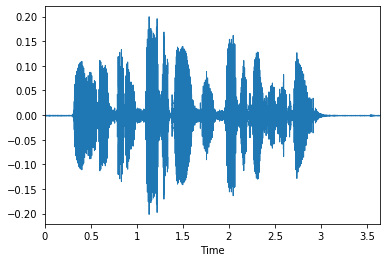

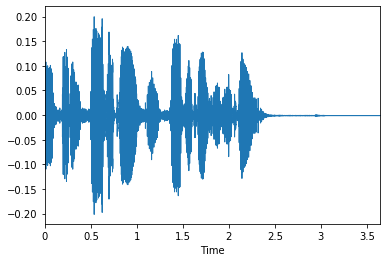

In [ ]:
shifter = SignalShifter(p=1, max_pct=0.5)
inp, out = show_transform(shifter, GenExample.audio_sc)

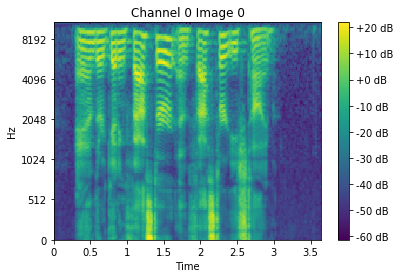

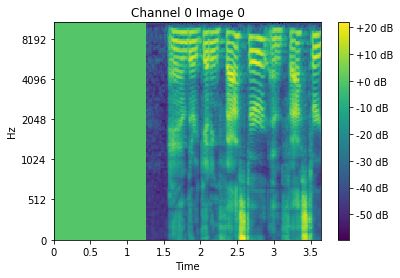

In [ ]:
sg_orig.show()
altered = shifter(sg_orig, split_idx=0)
altered.show()

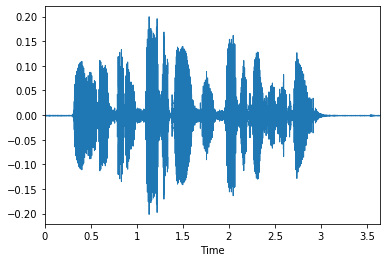

torch.Size([8, 1, 58240])


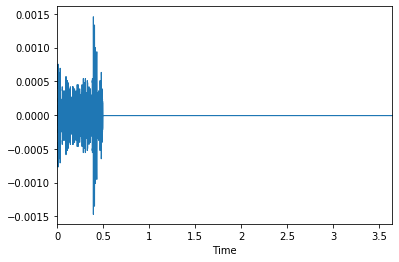

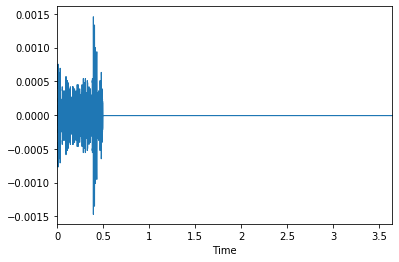

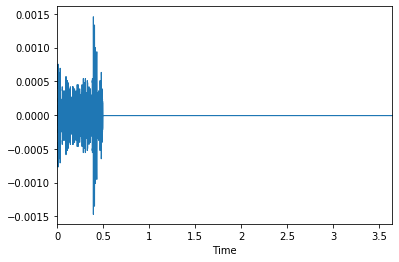

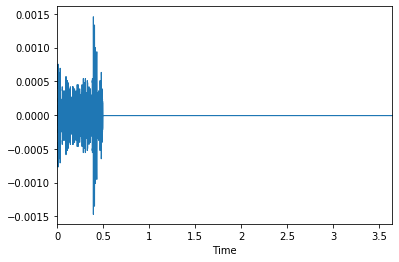

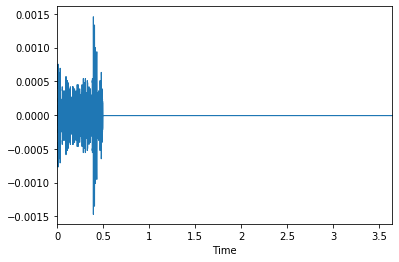

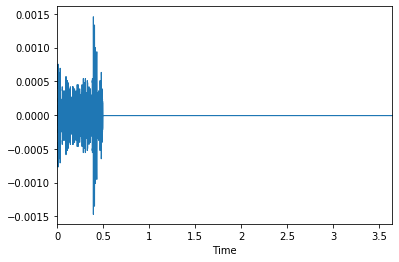

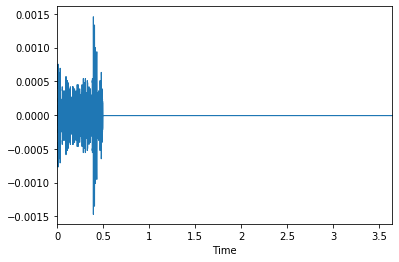

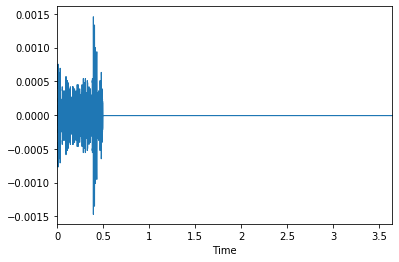

In [ ]:
audio_orig = GenExample.audio_sc_batch(8)
shifter = SignalShifter(p=1, max_pct=1)
AudioItem.from_signal(audio_orig[0], 16000).show()
altered = shifter(audio_orig, split_idx=0)

#AudioItem((audio_orig[0], 16000, None)).show()
print(altered.shape)
for sig in altered:
    AudioItem.from_signal(sig, 16000).show()


In [ ]:
audio_orig = GenExample.audio_sc()

In [ ]:
%%time
altered = shifter(audio_orig, split_idx=0)

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 276 µs


In [ ]:
%%timeit -n3
altered = shifter(audio_orig, split_idx=0)

123 µs ± 33.2 µs per loop (mean ± std. dev. of 7 runs, 3 loops each)


In [ ]:
audio_orig = GenExample.audio_sc_batch(32)

In [ ]:
%%time
altered = shifter(audio_orig, split_idx=0)

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 639 µs


In [ ]:
%%time
altered = shifter(sg_orig, split_idx=0)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 336 µs


### Example without rolling

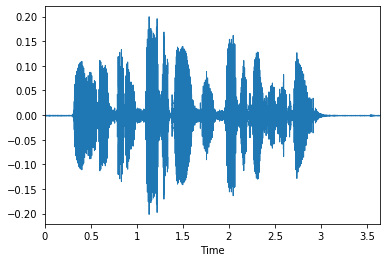

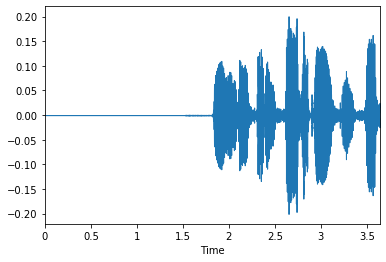

In [ ]:
shifter = SignalShifter(p=1, max_pct=0.5)
inp, out = show_transform(shifter, GenExample.audio_sc)

In [ ]:
# test a time shift of 1s never shifts more than 1s
for i in range(100):
    time_shifter = SignalShifter(p=1, max_time=1)
    gen_func = lambda: AudioItem.from_signal(torch.ones(1, 16000), 16000)
    inp, out = show_transform(time_shifter, gen_func, show=None)
    #just_ones = AudioItem((torch.ones(16000).unsqueeze(0), 16000, None))
    test_eq(False, torch.allclose(out, torch.zeros(16000)))

In [ ]:
# demonstrate shifting works on multichannel data (alter show to True to see)
shifter = SignalShifter(p=1, max_time=1)
inp, out = show_transform(shifter, GenExample.audio_mc, show=None)

### Example with rolling

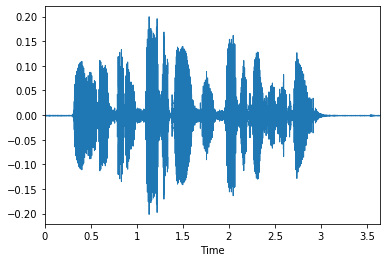

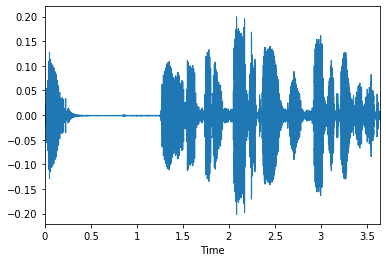

In [ ]:
shift_and_roll = SignalShifter(p=1, max_pct=0.5, roll=True)
inp, out = show_transform(shift_and_roll, GenExample.audio_sc)
test_eq(inp.data.shape, out.data.shape)

#### Shift Timing Tests

In [ ]:
audio_orig = GenExample.audio_sc()

In [ ]:
%%time
shifted = shifter(audio_orig, split_idx=0)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 529 µs


In [ ]:
%%time
shifted = shift_and_roll(audio_orig, split_idx=0)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 576 µs


## Add Noise to Signal

Adds noise proportional to the energy of the signal (mean of abs value), and the specified noise level.

This uses [colorednoise](https://github.com/felixpatzelt/colorednoise)(imported as 'cn'), developed by a data scientist named [Felix Patzelt](https://github.com/felixpatzelt). It allows you to use one simple function to create white, brown, pink and other [colors of noise](https://en.wikipedia.org/wiki/Colors_of_noise). Each color corresponds to an exponent, violet is -2, blue -1, white is 0, pink is 1, and brown is 2. We abstract this with a class that enumerates the list and shifts it down by two so the exponents are correct, and so that we get tab-completion.

Because this actually draws a spectrogram and does an istft on it, it is about 10x faster if we implement our own white noise (simple and worth doing since it's the most common noise we'll want to use, this is what the `if color=0` line does, it overrides and generates white noise using our own simple algo. (**Note: Most recent timing tests actually show the opposite, that generating our own white noise is 3x slower? This should be looked into later**) 

For just plain white noise, if we revert to remove the dependency on this library, the noise can be created with  
`noise = torch.randn_like(ai.sig) * ai.sig.abs().mean() * noise_level`

In [ ]:
# export
mk_class('NoiseColor', **{o:i-2 for i,o in enumerate(['Violet', 'Blue', 'White', 'Pink', 'Brown'])},
         doc="All possible colors of noise as attributes to get tab-completion and typo-proofing")

In [ ]:
# export
def AddNoise(noise_level=0.05, color=NoiseColor.White):
    def _inner(ai: AudioItem)->AudioItem:
        # if it's white noise, implement our own for speed
        if color==0: noise = torch.randn_like(ai.data)
        else:        noise = torch.from_numpy(cn.powerlaw_psd_gaussian(exponent=color, size=ai.nsamples)).float()
        scaled_noise = noise * ai.data.abs().mean() * noise_level
        ai.data += scaled_noise
        return ai
    return _inner

### White noise examples (default)

Original Audio


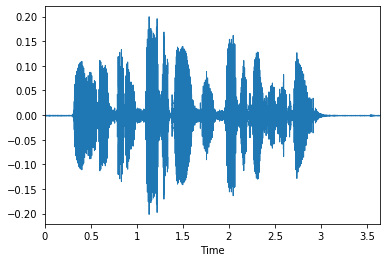

5% White Noise(Default)


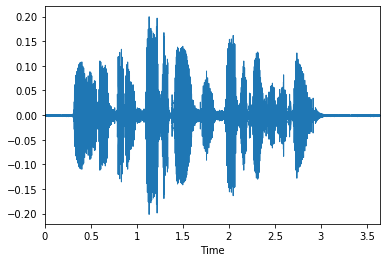

50% White Noise


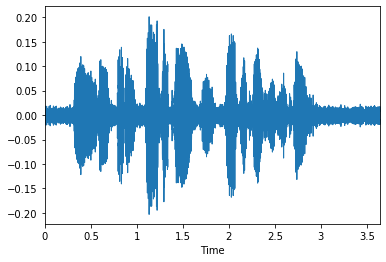

In [ ]:
noisy = AddNoise()
real_noisy = AddNoise(noise_level=0.5)
inp, out5 = show_transform(noisy, GenExample.audio_sc, show=None)
inp, out50 = show_transform(real_noisy, GenExample.audio_sc, show=None)
msgs = ["Original Audio", "5% White Noise(Default)", "50% White Noise"]
for i, aud in enumerate([inp, out5, out50]):
    print(msgs[i])
    aud.show()

### Pink Noise Examples

Original Audio


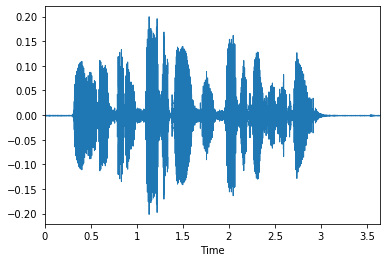

5% Pink Noise


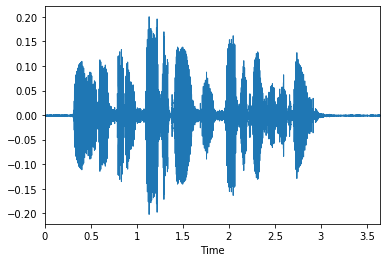

100% Pink Noise


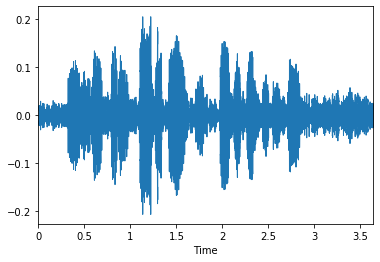

In [ ]:
noisy = AddNoise(color=NoiseColor.Pink)
real_noisy = AddNoise(noise_level=1, color=NoiseColor.Pink)
inp, out5 = show_transform(noisy, GenExample.audio_sc, show=None)
inp, out100 = show_transform(real_noisy, GenExample.audio_sc, show=None)
msgs = ["Original Audio", "5% Pink Noise", "100% Pink Noise"]
for i, aud in enumerate([inp, out5, out100]):
    print(msgs[i])
    aud.show()

In [ ]:
# demonstrate blue-noise on multichannel data (change "show=None" to "show=True" to see)
noisy = AddNoise(noise_level=0.5, color=NoiseColor.Blue)
show_transform(noisy, GenExample.audio_mc, show=None)
#noisy.show()

(tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., -8.8501e-04,
          -6.7139e-04, -2.4414e-04],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           1.2207e-04,  1.8311e-04],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  1.5259e-04,
           9.1553e-05,  3.0518e-05]]),
 tensor([[-0.0039, -0.0007, -0.0065,  ...,  0.0049, -0.0084,  0.0099],
         [-0.0039, -0.0007, -0.0065,  ...,  0.0058, -0.0076,  0.0104],
         [-0.0039, -0.0007, -0.0065,  ...,  0.0059, -0.0076,  0.0102]]))

#### Noise Timing Tests

In [ ]:
%%timeit -n10
noise = torch.from_numpy(cn.powerlaw_psd_gaussian(exponent=0, size=audio_orig.nsamples)).float()
scaled_noise = noise * audio_orig.data.abs().mean() * 0.05
out = AudioItem.from_signal(audio_orig.data + scaled_noise,audio_orig.sr)

4.41 ms ± 254 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
%%timeit -n10
#Same speed for white noise and brown noise using their algorithm
noise = torch.from_numpy(cn.powerlaw_psd_gaussian(exponent=2, size=audio_orig.nsamples)).float()
scaled_noise = noise * audio_orig.abs().mean() * 0.05
out = AudioItem.from_signal(audio_orig.data + scaled_noise,audio_orig.sr)

4.53 ms ± 67.9 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
%%timeit -n10
noisy = AddNoise(color=NoiseColor.White)(audio_orig)

515 µs ± 42.3 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Adjust Volume

<div class = "alert alert-block alert-warning"><strong>Note:</strong><br> 
   This will increase/decrease the energy of the signal but so far it appears to do nothing besides change the absolute values as the audios sound the same, and the spectrograms appear the same. The gain is being correctly applied, but the ipython audio player seems to normalize the volume level (confirmed by outputting and downloading the clips and confirming a difference in noise level). The spectrogram appears the same because it too does a form of normalization when it sets `ref`. We will likely need to adjust the ref value to something constant like np.max or 0 to stop this normalization, as the noise_level is often relevant for deep learning and not something we want to strip out.<br></div>


In [ ]:
# export
@patch
def apply_gain(ai:AudioItem, gain):
    ai.data *= gain
    return ai

In [ ]:
#export
class ChangeVolume(RandTransform):
    def __init__(self, p=0.5, lower=0.5, upper=1.5):
        self.lower, self.upper = lower, upper
        super().__init__(p=p, as_item=True)
        
    def before_call(self, b, split_idx):
        super().before_call(b, split_idx)
        self.gain = random.uniform(self.lower, self.upper)
        
    def encodes(self, ai:AudioItem): return apply_gain(ai, self.gain)

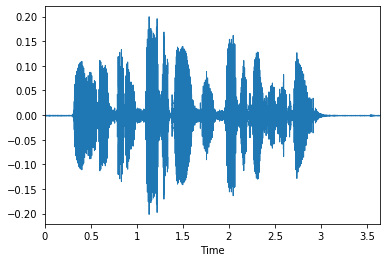

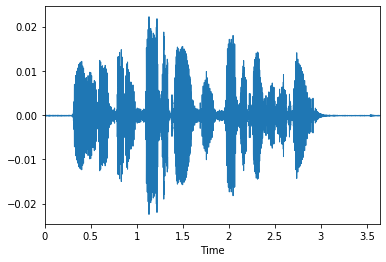

In [ ]:
#ipython player normalizes out volume difference, note different y-axis scale but same sound.
volume_adjuster = ChangeVolume(p=1, lower=0.01, upper=0.5)
inp, out = show_transform(volume_adjuster, GenExample.audio_sc)

#### Adjust Volume Timing Tests

In [ ]:
audio_orig = GenExample.audio_sc
audio_mc = GenExample.audio_mc

In [ ]:
%%timeit -n10
volume_adjuster(audio_orig, split_idx=0)

29.7 µs ± 5.21 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
%%timeit -n10
volume_adjuster(audio_mc, split_idx=0)

28.2 µs ± 2.25 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Signal Cutout

In [ ]:
# export
@patch
def cutout(ai:AudioItem, cut_pct):
    mask = torch.zeros(int(ai.nsamples*cut_pct))
    mask_start = random.randint(0,ai.nsamples-len(mask))
    ai.data[:,mask_start:mask_start+len(mask)] = mask
    return ai

# @patch
# def cutout(sg:AudioSpectrogram, cut_pct):

In [ ]:
#export
class SignalCutout(RandTransform):
    def __init__(self, p=0.5, max_cut_pct=0.15):
        self.max_cut_pct = max_cut_pct
        super().__init__(p=p, as_item=True)
        
    def before_call(self, b, split_idx):
        super().before_call(b, split_idx)
        self.cut_pct = random.uniform(0, self.max_cut_pct)
        
    def encodes(self, ai:AudioItem): return cutout(ai, self.cut_pct)

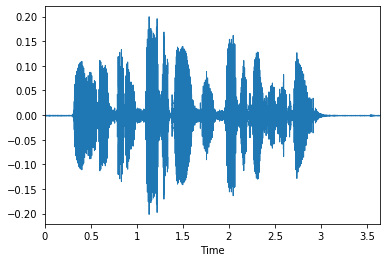

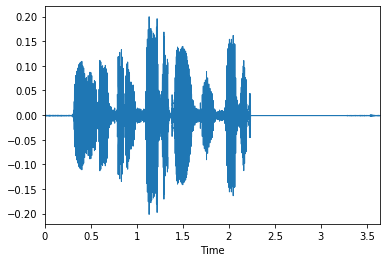

In [ ]:
cutter = SignalCutout(p=1, max_cut_pct=0.3)
inp, out = show_transform(cutter, GenExample.audio_sc)

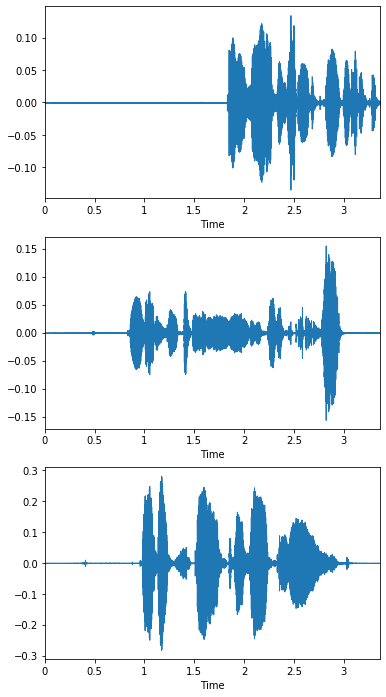

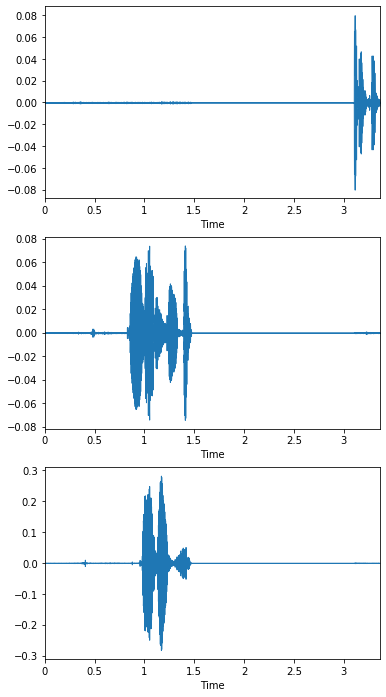

In [ ]:
# demonstrate SignalCutout on multichannel, confirm the cuts align, (change "show=None" to "show=True" to see)
cut_mc = SignalCutout(p=1, max_cut_pct=0.5)
inp, out = show_transform(cut_mc, GenExample.audio_mc, show=True)

#### Signal Cutout Timing Tests

In [ ]:
audio_orig = GenExample.audio_sc
audio_mc = GenExample.audio_mc

In [ ]:
%%timeit -n10
cutter(audio_orig, split_idx=0)

30 µs ± 3.3 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
%%timeit -n10
cutter(audio_mc, split_idx=0)

29.2 µs ± 3.34 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Signal Loss 

In [ ]:
# export
@patch
def lose_signal(ai:AudioItem, loss_pct):
    mask = (torch.rand_like(ai.data[0])>loss_pct).float()
    ai.data[...,:] *= mask
    return ai

In [ ]:
# export
class SignalLoss(RandTransform):
    def __init__(self, p=0.5, max_loss_pct = 0.15):
        self.max_loss_pct = max_loss_pct
        super().__init__(p=p, as_item=True)

    def before_call(self, b, split_idx):
        super().before_call(b, split_idx)
        self.loss_pct = random.uniform(0, self.max_loss_pct)
        
    def encodes(self, ai:AudioItem): return lose_signal(ai, self.loss_pct)

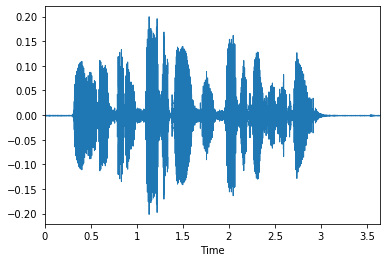

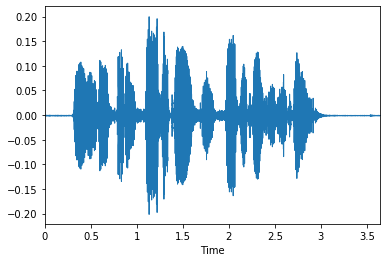

Percent Dropped: 14.70


In [ ]:
dropper = SignalLoss(p=1, max_loss_pct=0.3)
inp, out = show_transform(dropper, GenExample.audio_sc, show=True)
print(f"Percent Dropped: {100*dropper.loss_pct:.2f}")

In [ ]:
# Updating to a RandTransform broke these tests

# verify SignalDrop is dropping both the correct number of samples, and dropping
# the same samples from each channel, over a wide range of cut_pcts
# nsamples = fake_multichannel.nsamples
# for cut_pct in np.linspace(0.05, 0.5, 45):
#     dropped_mc = SignalDrop(cut_pct)(fake_multichannel)
#     match1 = (dropped_mc.sig[0] == dropped_mc.sig[1]).sum()
#     match2 = (dropped_mc.sig[0] == dropped_mc.sig[2]).sum()
#     match3 = (dropped_mc.sig[1] == dropped_mc.sig[2]).sum()
#     test_close(match1, cut_pct*nsamples, eps=.02*nsamples)
#     test_close(match2, cut_pct*nsamples, eps=.02*nsamples)
#     test_close(match3, cut_pct*nsamples, eps=.02*nsamples)

#### Signal Drop Timing Tests

In [ ]:
audio_orig = GenExample.audio_sc
audio_mc = GenExample.audio_mc

In [ ]:
%%timeit -n10
dropper(audio_orig, split_idx=0)

29.5 µs ± 4.39 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
%%timeit -n10
dropper(audio_mc, split_idx=0)

28.9 µs ± 3.82 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


## DownmixMono

In [ ]:
#export
# downmixMono was removed from torchaudio, we now just take the mean across channels
# this works for both batches and individual items
def DownmixMono():
    def _inner(ai: AudioItem)->AudioItem:
        """Randomly replaces amplitude of signal with 0. Simulates analog info loss"""
        downmixed = ai.data.contiguous().mean(-2).unsqueeze(-2)
        return AudioItem.from_signal(downmixed, ai.sr)
    return _inner

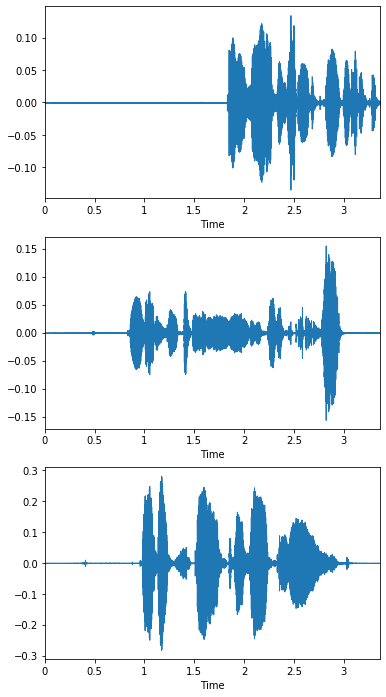

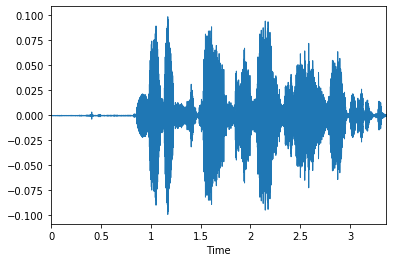

In [ ]:
downmixer = DownmixMono()
inp, out = show_transform(downmixer, GenExample.audio_mc, show=True)

In [ ]:
# test downmixing 1 channel has no effect
inp, out = show_transform(downmixer, GenExample.audio_sc, show=None)
test_eq(inp.data, out.data)

In [ ]:
# example showing a batch of 8 signals 
inp, out = show_transform(downmixer, GenExample.audio_mc_batch, show=None)
print(f"Before shape: {inp.shape}\nAfter shape: {out.shape}")

Before shape: torch.Size([8, 3, 53760])
After shape: torch.Size([8, 1, 53760])


#### DownmixMono Timing Tests

In [ ]:
audio_mc = GenExample.audio_mc()

In [ ]:
%%timeit -n10
downmixer(audio_mc)

91 µs ± 12.8 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


# Spectrogram Transforms

##  Time Cropping

<div class = "alert alert-block alert-info"><strong>TO-DO:</strong><br> 
   1. In spectrogram when we pad with mean value we mess up normalization by altering std dev, how can we use fill values that dont mess things up<br></div>


In [ ]:
#export
def CropTime(duration, pad_mode=AudioPadType.Zeros):
    def _inner(sg:AudioSpectrogram)->AudioSpectrogram:
        '''Random crops full spectrogram to be length specified in ms by crop_duration'''
        sr, hop = sg.sr, sg.hop_length
        w_crop = int((sr*duration)/(1000*hop))+1
        w_sg   = sg.shape[-1]
        if     w_sg == w_crop: sg_crop = sg
        elif   w_sg <  w_crop: sg_crop = _tfm_pad_spectro(sg, w_crop, pad_mode=pad_mode)
        else:
            crop_start = random.randint(0, int(w_sg - w_crop)) 
            sg_crop = sg[:,:,crop_start:crop_start+w_crop]
            sg_crop.sample_start = int(crop_start*hop)
            sg_crop.sample_end   = sg_crop.sample_start + int(duration*sr)
        sg.data = sg_crop
        return sg
    return _inner

In [ ]:
#export
def _tfm_pad_spectro(sg, width, pad_mode=AudioPadType.Zeros):
    '''Pad spectrogram to specified width, using specified pad mode'''
    c,y,x = sg.shape
    pad_m = pad_mode.lower()
    if pad_m in ["zeros", "zeros_after"]:
        padded = torch.zeros((c,y,width))
        start = random.randint(0, width-x) if pad_m == "zeros" else 0
        padded[:,:,start:start+x] = sg.data
        return padded
    elif pad_m == "repeat":
        repeats = width//x + 1
        return sg.repeat(1,1,repeats)[:,:,:width]
    else:
        raise ValueError(f"pad_mode {pad_m} not currently supported, only 'zeros', 'zeros_after', or 'repeat'")

In [ ]:
audio_orig = GenExample.audio_sc()

In [ ]:
crop_1000ms = CropTime(1000)
crop_2000ms = CropTime(2000)
crop_5000ms = CropTime(5000)
print(f"Audio is {audio_orig.duration} seconds")

Audio is 3.64 seconds


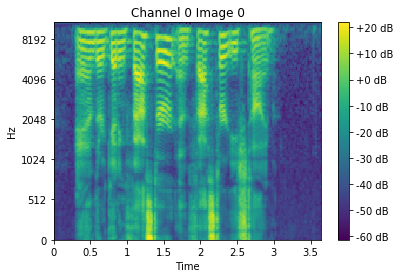

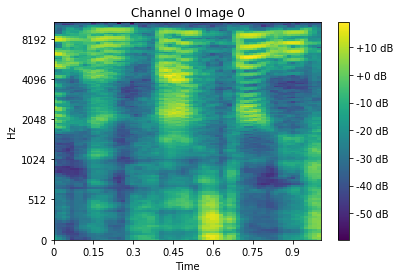

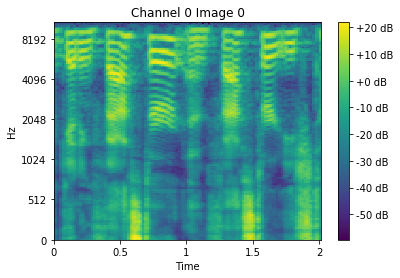

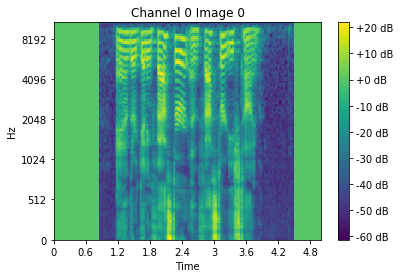

In [ ]:
orig_settings = dict(GenExample.sg_sc().settings)
inp, out1 = show_transform(crop_1000ms, GenExample.sg_sc, show=None)
inp, out2 = show_transform(crop_2000ms, GenExample.sg_sc, show=None)
inp, out5 = show_transform(crop_5000ms, GenExample.sg_sc, show=None)
for spec in [inp, out1, out2, out5]:
    spec.show()

<div class = "alert alert-block alert-info"><strong>Note:</strong><br> 
    Because a spectrograms duration is dependent on rounding (samples/hop_length usually has a remainder that is padded up to an extra pixel), we cant use exact durations, so we must test_close instead of test_eq. This could be fixed by storing the AudioItems duration when the sg is generated, and also updating the duration manually anytime a Transform occurs that affects the size time axis (x-axis)
</div>


In [ ]:
inp.duration, out1.duration, out5.duration

(3.64, 1.0, 5.0)

In [ ]:
test_eq(orig_settings, out1.settings)
test_eq(orig_settings, out5.settings)
test_close(out1.width, int((1/inp.duration)*inp.width), eps=1.01)
test_close(out2.width, int((2/inp.duration)*inp.width), eps=1.01)
test_close(out5.width, int((5/inp.duration)*inp.width), eps=1.01)

In [ ]:
# test AudioToSpec->CropTime and CropSignal->AudioToSpec will result in same size images
oa = OpenAudio(files)
crop_dur = random.randint(1000,5000)
pipe_cropsig  = Pipeline([oa, AudioToSpec(hop_length=128), CropTime(crop_dur)], as_item=True)
pipe_cropspec = Pipeline([oa, CropSignal(crop_dur), AudioToSpec(hop_length=128), ], as_item=True)
for i in range(50):
    test_eq(pipe_cropsig(i).width, pipe_cropspec(i).width)

In [ ]:
# test pad_mode zeros-after by verifying sg ends with zeros and begins with non-zeros
sg_orig = GenExample.sg_sc()
crop_5000ms = CropTime(5000, pad_mode=AudioPadType.Zeros_After)
crop_5000ms(sg_orig)
test_eq(sg_orig[:,:,-1], torch.zeros_like(sg_orig)[:,:,-1])
test_ne(sg_orig[:,:,0], torch.zeros_like(sg_orig)[:,:,-1])
test_eq(sg_orig.duration, 5)

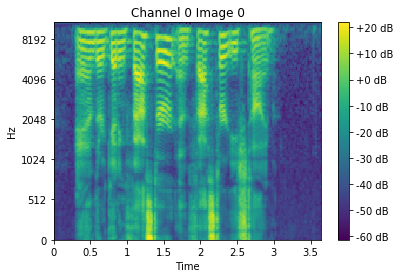

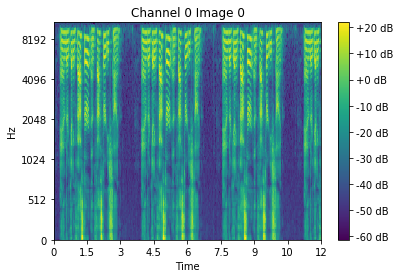

In [ ]:
# test pad_mode repeat by making sure that columns are equal at the appropriate offsets
crop_12000ms_repeat = CropTime(12000, pad_mode=AudioPadType.Repeat)
inp,out = show_transform(crop_12000ms_repeat, GenExample.sg_sc, show=True)
for i in range(inp.width):
    test_eq(out[:,:,i], out[:,:,i+inp.width])
    test_eq(out[:,:,i], out[:,:,i+2*inp.width])

In [ ]:
# test bad pad_mode doesnt fail silently, correct is 'zeros_after'
test_fail(CropTime(12000, pad_mode="zerosafter"))

In [ ]:
out1.shape, out2.shape, out5.shape

(torch.Size([1, 128, 63]),
 torch.Size([1, 128, 126]),
 torch.Size([1, 128, 313]))

In [ ]:
# demonstrate on multichannel audio, (change "show=None" to "show=True" to see)
inp,out = show_transform(crop_1000ms, GenExample.sg_mc, show=None)

#### CropTime Timing Tests

In [ ]:
sg_orig = GenExample.sg_sc()

In [ ]:
%%time
#1s zero-padded crop
out = crop_1000ms(sg_orig)

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 95.8 µs


In [ ]:
%%time
#5s zero-padded crop
out = crop_5000ms(sg_orig)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 211 µs


In [ ]:
%%time
#12s repeat-padded crop
out = crop_12000ms_repeat(sg_orig)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 434 µs


<div class = "alert alert-block alert-info"> If we wanted to we could make a class for these transforms that keeps the masked portion as state so that we could write a decodes method to go back to the original</div>


## Time and Frequency Masking (SpecAugment)

In [ ]:
#export
def MaskFreq(num_masks=1, size=20, start=None, val=None, **kwargs):
    def _inner(sg:AudioSpectrogram)->AudioSpectrogram:
        '''Google SpecAugment time masking from https://arxiv.org/abs/1904.08779.'''
        nonlocal start
        channel_mean = sg.contiguous().view(sg.size(0), -1).mean(-1)[:,None,None]
        mask_val = channel_mean if val is None else val
        c, y, x = sg.shape
        for _ in range(num_masks):
            mask = torch.ones(size, x) * mask_val    
            if start is None: start= random.randint(0, y-size)
            if not 0 <= start <= y-size:
                raise ValueError(f"Start value '{start}' out of range for AudioSpectrogram of shape {sg.shape}")
            sg[:,start:start+size,:] = mask
            start = None
        return sg
    return _inner

<div class = "alert alert-block alert-warning"> Passing around the settings manually is already fairly clunky, but is especially bad when we have to do it twice when MaskTime hands off to MaskFrequency. We should maybe make a copy of the AudioSpectrogram and then alter the tensor for it's sg rather than cloning out the sg and then building a new object at the end. Or just keep a reference to the parent tensor and pass that along, and have getattr recur looking for settings of the parents</div>


In [ ]:
#export
def MaskTime(num_masks=1, size=20, start=None, val=None, **kwargs):
    def _inner(sg:AudioSpectrogram)->AudioSpectrogram:
        sg.data = torch.einsum('...ij->...ji', sg)
        sg.data = MaskFreq(num_masks, size, start, val, **kwargs)(sg)
        sg.data = torch.einsum('...ij->...ji', sg)
        return sg
    return _inner

In [ ]:
sg_orig = GenExample.sg_sc()

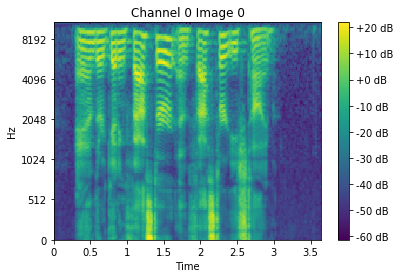

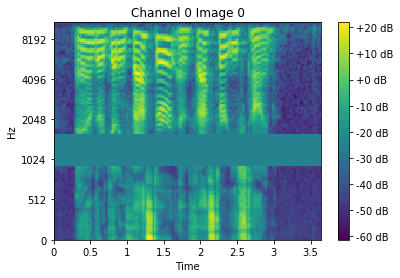

In [ ]:
inp,out = show_transform(MaskFreq(), GenExample.sg_sc)

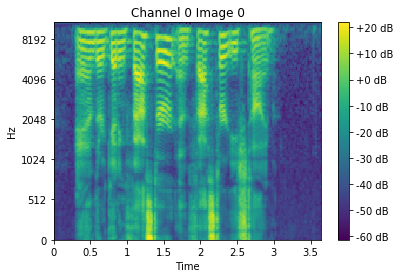

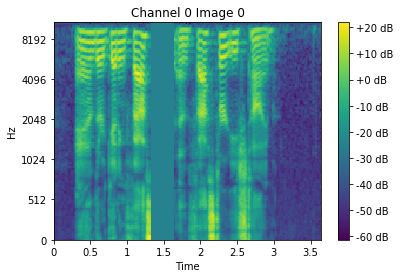

In [ ]:
inp,out = show_transform(MaskTime(), GenExample.sg_sc)

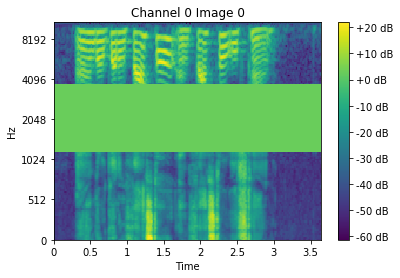

In [ ]:
# create a random frequency mask and test that it is being correctly applied
size, start, val = [random.randint(1, 50) for i in range(3)]
freq_mask_test = MaskFreq(size=size, start=start, val=val)
inp,out = show_transform(freq_mask_test, GenExample.sg_sc, show=None)
out.show()
test_eq(out[:,start:start+size,:], val*torch.ones_like(inp)[:,start:start+size,:])

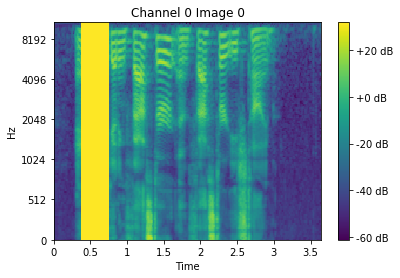

In [ ]:
# create a random time mask and test that it is being correctly applied
size, start, val = [random.randint(1, 50) for i in range(3)]
time_mask_test = MaskTime(size=size, start=start, val=val)
inp,out = show_transform(time_mask_test, GenExample.sg_sc, show=None)
out.show()
test_eq(out[:,:,start:start+size], val*torch.ones_like(inp)[:,:,start:start+size])

In [ ]:
# demonstrate on multichannel audio, (change "show=None" to "show=True" to see)
inp,out = show_transform(MaskFreq(size=40), GenExample.sg_mc, show=None)

#### SpecAugment Timing Tests

In [ ]:
sg_orig = GenExample.sg_sc()

In [ ]:
%%time
out = freq_mask(sg_orig)

NameError: name 'freq_mask' is not defined

In [ ]:
sg_orig = GenExample.sg_sc()

In [ ]:
%%time
# time masking ~90µs slower because we transpose, delegate to MaskFreq, and transpose back, we could
# fix this at the expense of a bit more code 
out = time_mask(sg_orig)

NameError: name 'time_mask' is not defined

In [ ]:
sg_mc = GenExample.sg_mc()

In [ ]:
%%time
out = freq_mask(sg_mc)

NameError: name 'freq_mask' is not defined

## Spectrogram Rolling

In [ ]:
#export
def SGRoll(max_shift_pct=0.5, direction=0, **kwargs):
    '''Shifts spectrogram along x-axis wrapping around to other side'''
    if int(direction) not in [-1, 0, 1]: 
        raise ValueError("Direction must be -1(left) 0(bidirectional) or 1(right)")
    def _inner(sg:AudioSpectrogram)->AudioSpectrogram:
        nonlocal direction
        direction = random.choice([-1, 1]) if direction == 0 else direction
        w = sg.shape[-1]
        roll_by = int(w*random.random()*max_shift_pct*direction)
        sg.data = sg.roll(roll_by, dims=-1)
        return sg
    return _inner

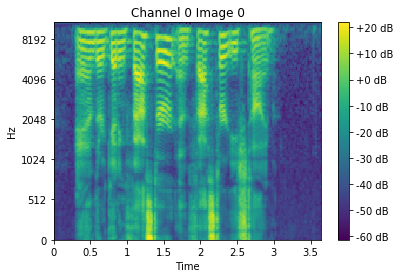

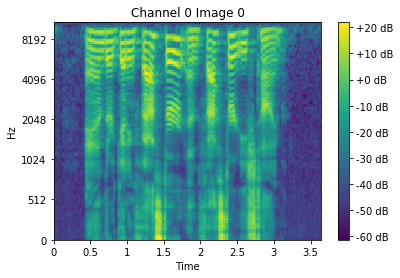

In [ ]:
inp,out = show_transform(SGRoll(), GenExample.sg_sc)

In [ ]:
# demonstrate on multichannel audio, (change "show=None" to "show=True" to see)
inp,out = show_transform(SGRoll(), GenExample.sg_mc, show=None)

#### SGRollTiming Tests

In [ ]:
sg_orig = GenExample.sg_sc()
sg_multi = GenExample.sg_mc()
roller = SGRoll()

In [ ]:
%%time
out = roller(sg_orig)

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 1.11 ms


In [ ]:
%%time
out = roller(sg_multi)

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 1.52 ms


## Delta/Accelerate 

<div class = "alert alert-block alert-info"><strong>TO-DO:</strong> Test delta as part of a pipeline to make sure SpecAugment/roll/interpolate...etc are working on multichannel</div>


In [ ]:
#export
def _torchdelta(sg:AudioSpectrogram, order=1, width=9):
    '''Converts to numpy, takes delta and converts back to torch, needs torchification'''
    if(sg.shape[1] < width): 
        raise ValueError(f'''Delta not possible with current settings, inputs must be wider than 
        {width} columns, try setting max_to_pad to a larger value to ensure a minimum width''')
    return AudioSpectrogram(torch.from_numpy(librosa.feature.delta(sg.numpy(), order=order, width=width)))

In [ ]:
#export
def Delta(width=9):
    td = partial(_torchdelta, width=width)
    def _inner(sg:AudioSpectrogram)->AudioSpectrogram:
        new_channels = [torch.stack([c, td(c, order=1), td(c, order=2)]) for c in sg]
        sg.data = torch.cat(new_channels, dim=0)
        return sg
    return _inner

In [ ]:
delta = Delta()

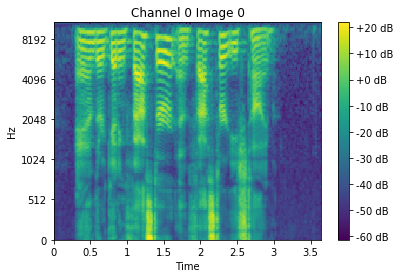

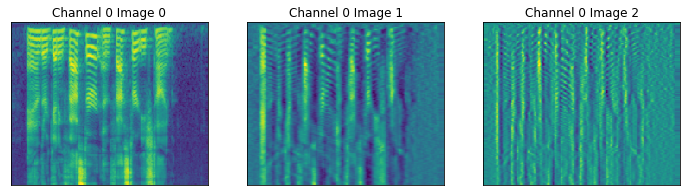

In [ ]:
inp, out = show_transform(delta, GenExample.sg_sc)
#nchannels for a spectrogram is how many channels its original audio had
test_eq(out.nchannels, inp.nchannels)
test_eq(out.shape[1:], inp.shape[1:])
test_ne(out[0],out[1])

In [ ]:
# demonstrate delta on multichannel audio, (change "show=None" to "show=True" to see)
inp,out = show_transform(delta, GenExample.sg_mc, show=None)

#### Delta Timing Tests

In [ ]:
sg_orig = GenExample.sg_sc()
sg_mc = GenExample.sg_mc()

In [ ]:
%%time
out = delta(sg_orig)

CPU times: user 8 ms, sys: 0 ns, total: 8 ms
Wall time: 3.37 ms


In [ ]:
%%time
out = delta(sg_mc)

CPU times: user 32 ms, sys: 0 ns, total: 32 ms
Wall time: 8.3 ms


## Image resizing

<div class = "alert alert-block alert-info"> This should probably be refactored to use visions size transform since it already exists</div>


In [ ]:
#export
def TfmResize(size, interp_mode="bilinear", **kwargs):
    '''Temporary fix to allow image resizing transform'''
    def _inner(sg:AudioSpectrogram)->AudioSpectrogram:
        nonlocal size
        if isinstance(size, int): size = (size, size)
        c,y,x = sg.shape
        sg.data = F.interpolate(sg.unsqueeze(0), size=size, mode=interp_mode, align_corners=False).squeeze(0)
        return sg
    return _inner

In [ ]:
# Test when size is an int
size = 224
resize_int = TfmResize(size)
inp, out = show_transform(resize_int, GenExample.sg_sc, show=None)
print("Original Shape: ", inp.shape)
print("Resized Shape :" , out.shape)
test_eq(out.shape[1:], torch.Size([size,size]))

Original Shape:  torch.Size([1, 128, 228])
Resized Shape : torch.Size([1, 224, 224])


In [ ]:
# Test when size is a tuple with unequal values
size_tup=(124,581)
resize_tup = TfmResize(size_tup)
inp, out = show_transform(resize_tup, GenExample.sg_sc, show=None)
print("Original Shape: ", inp.shape)
print("Resized Shape :" , out.shape)
test_eq(out.shape[1:], torch.Size(size_tup))

Original Shape:  torch.Size([1, 128, 228])
Resized Shape : torch.Size([1, 124, 581])


In [ ]:
# demonstrate resizing on multichannel sg, (change "show=None" to "show=True" to see)
resizer = TfmResize((200,100))
inp,out = show_transform(resizer, GenExample.sg_mc, show=None)
print("Original Shape: ", inp.shape)
print("Resized Shape :" , out.shape)

Original Shape:  torch.Size([3, 128, 211])
Resized Shape : torch.Size([3, 200, 100])


#### Resize Timing Tests

In [ ]:
resizer = TfmResize(224)
sg_orig = GenExample.sg_sc()
sg_mc = GenExample.sg_mc()

In [ ]:
%%time
out = resizer(sg_orig)

CPU times: user 0 ns, sys: 4 ms, total: 4 ms
Wall time: 903 µs


In [ ]:
%%time
out = resizer(sg_mc)

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 1.24 ms


# Pipelines

## Signal Pipelines

In [ ]:
files

(#3842) [/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/f0004_us_f0004_00446.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/m0002_us_m0002_00128.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/f0003_us_f0003_00279.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/f0001_us_f0001_00168.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/f0005_us_f0005_00286.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/m0005_us_m0005_00282.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/f0005_us_f0005_00432.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/f0005_us_f0005_00054.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/m0004_us_m0004_00110.wav,/home/jupyter/.fastai/data/ST-AEDS-20180100_1-OS/m0003_us_m0003_00180.wav...]

In [ ]:
oa = OpenAudio(files); oa

OpenAudio: True (object,object) -> encodes (object,object) -> decodes

## Signal Pipelines

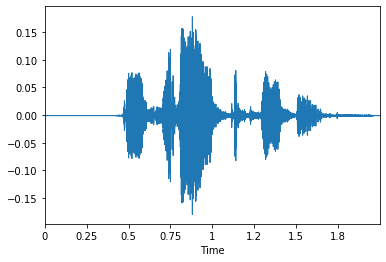

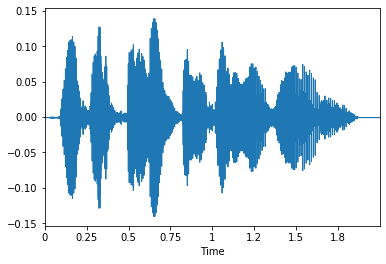

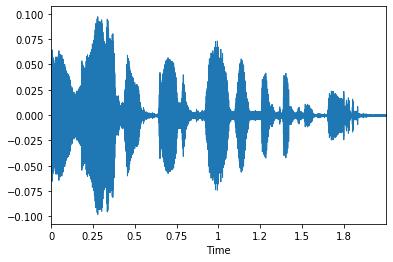

In [ ]:
#Show simple preprocessing that trims silence, crops to 2s, and resamples to 4000hz (low-quality)
preprocess_pipe = Pipeline([oa, RemoveSilence(), CropSignal(2000), Resample(4000)], as_item=True)
for i in range(3): preprocess_pipe(i).show()

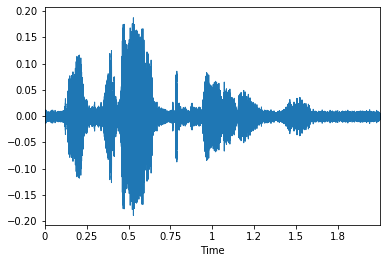

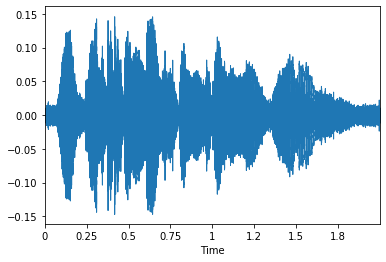

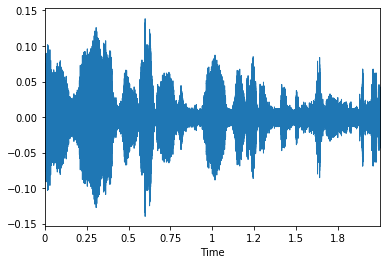

In [ ]:
#Show a very noisy set of signal augmentations
augment_pipe1 = Pipeline([oa, RemoveSilence(), CropSignal(2000), AddNoise(noise_level=0.3), SignalLoss()], as_item=True)
for i in range(3): augment_pipe1(i).show()

<div style="alert alert-block alert-warning"><strong>Bug:</strong> Signal Cutout does not appear to be working in this pipeline </div>

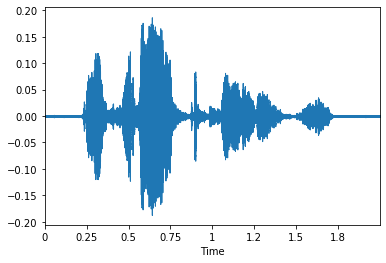

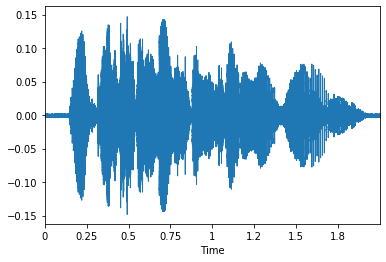

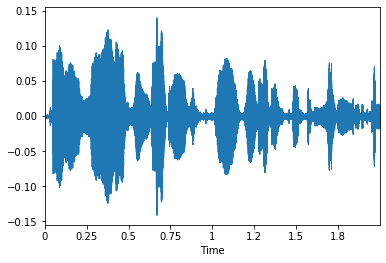

In [ ]:
#Show another set of signal augmentations
augment_pipe2 = Pipeline([oa, RemoveSilence(), CropSignal(2000), AddNoise(color=NoiseColor.Blue), 
                          SignalShifter(roll=True), SignalCutout()], as_item=True)
for i in range(3): augment_pipe2(i).show()

## Spectrogram Pipelines

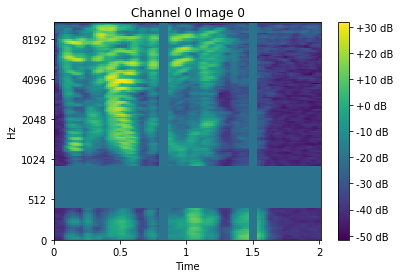

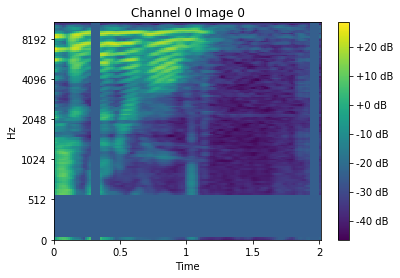

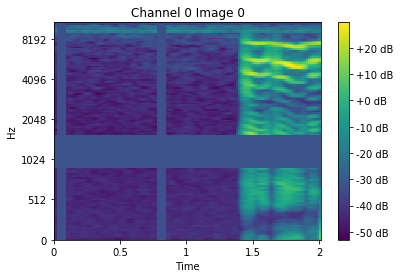

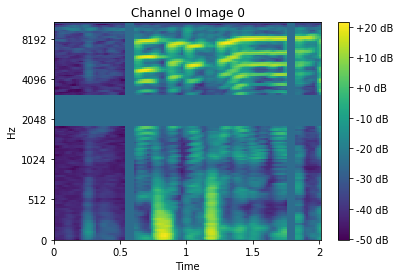

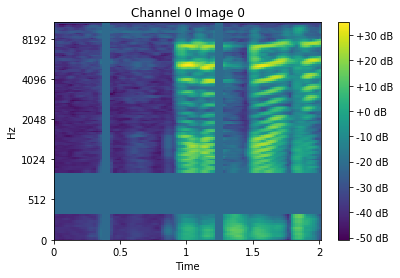

In [ ]:
#Basic melspectrogram pipe with advanced SpecAugment 
sg_cfg = AudioConfig.BasicMelSpectrogram(hop_length=256, n_fft=2048)
pipe = Pipeline([oa, AudioToSpec.from_cfg(sg_cfg), CropTime(2000), MaskTime(num_masks=2, size=4), MaskFreq()], as_item=True)
for i in range(5): pipe.show(pipe(i))

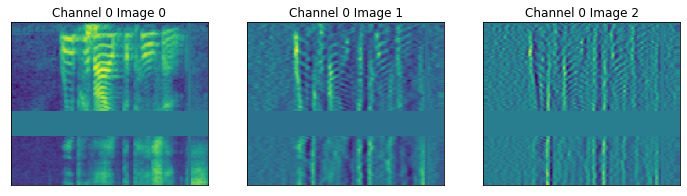

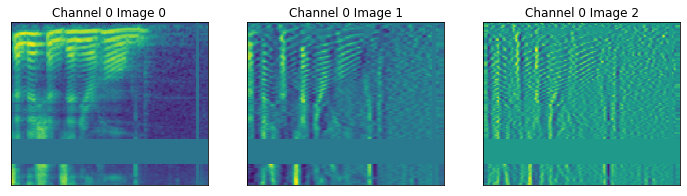

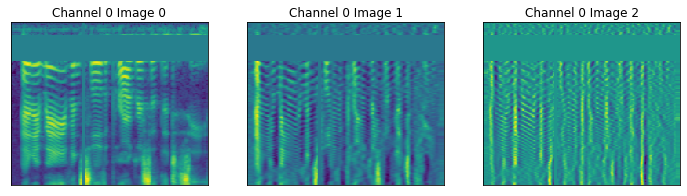

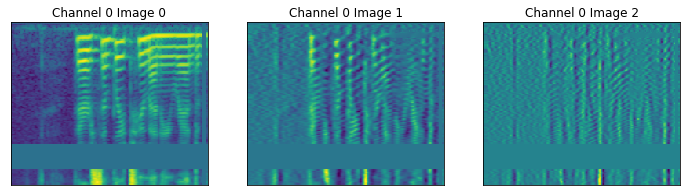

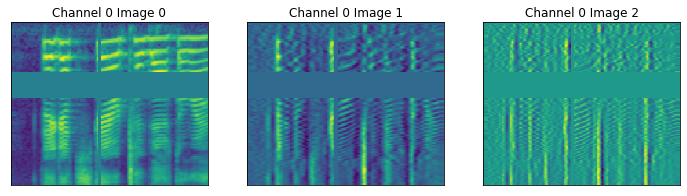

In [ ]:
#Pipe with only spectrogram transforms, notably Delta/Accelerate appended
voice_cfg = AudioConfig.Voice()
delta_pipe = Pipeline([oa, AudioToSpec.from_cfg(voice_cfg), CropTime(2000), Delta(), MaskTime(size=4), MaskFreq()], as_item=True)
for i in range(5): delta_pipe.show(delta_pipe(i))

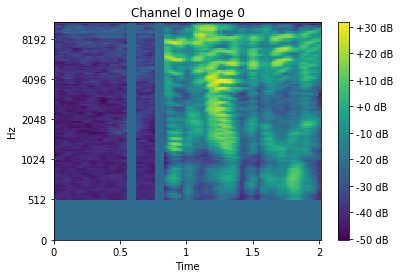

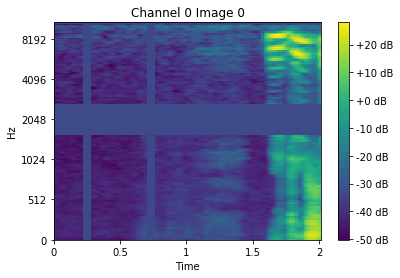

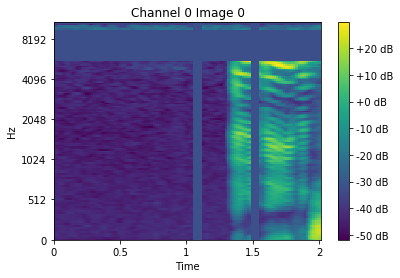

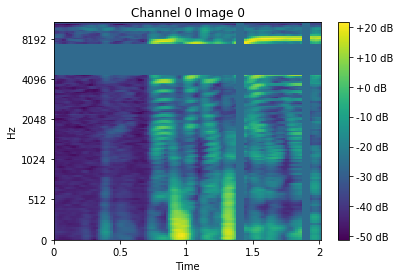

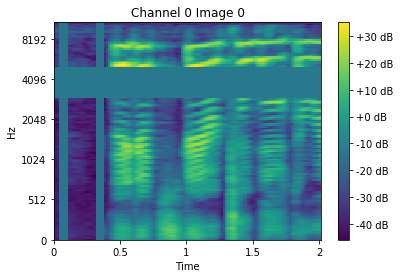

In [ ]:
for i in range(5): pipe.show(pipe(i))

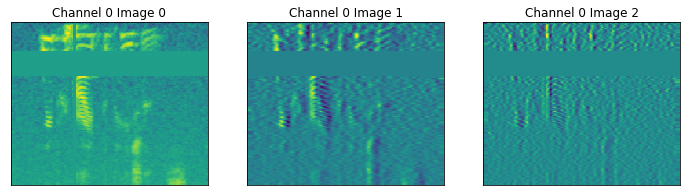

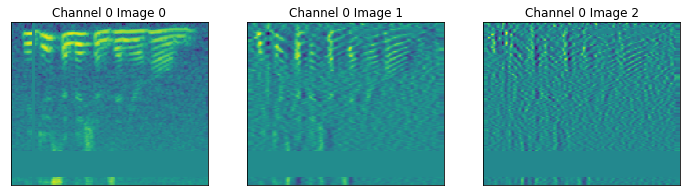

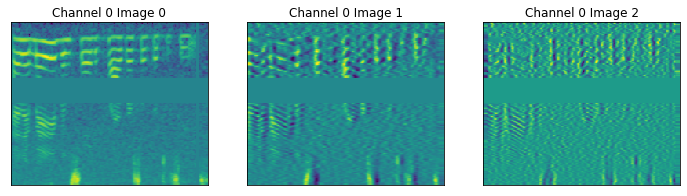

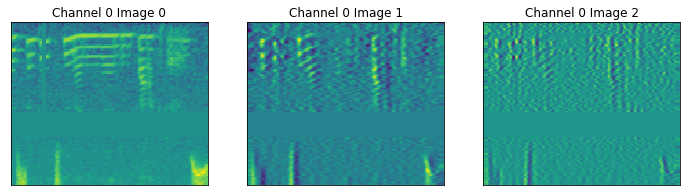

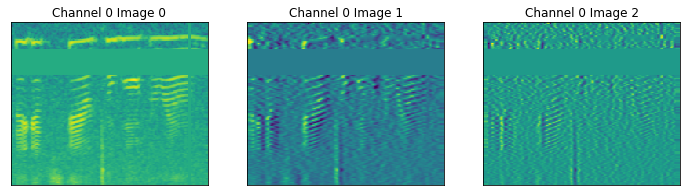

In [ ]:
#Pipe with signal and spectro transforms, and a lot of noise
voice_cfg = AudioConfig.Voice()
everything_pipe = Pipeline([oa, 
                            RemoveSilence(), CropSignal(2000), AddNoise(noise_level=0.3), SignalLoss(), 
                            AudioToSpec.from_cfg(voice_cfg), MaskTime(size=4), MaskFreq(), Delta()], as_item=True)
for i in range(5): everything_pipe.show(everything_pipe(i))

# Export

In [ ]:
#hide
from nbdev.export import notebook2script
notebook2script()

Converted 00_core.ipynb.
Converted 01_augment.ipynb.
Converted 02_tutorial.ipynb.
Converted index.ipynb.
